# Advanced Lane Finding Project

The goals / steps of this project are the following:

* Compute the camera calibration matrix and distortion coefficients given a set of chessboard images.
* Apply a distortion correction to raw images.
* Use color transforms, gradients, etc., to create a thresholded binary image.
* Apply a perspective transform to rectify binary image ("birds-eye view").
* Detect lane pixels and fit to find the lane boundary.
* Determine the curvature of the lane and vehicle position with respect to center.
* Warp the detected lane boundaries back onto the original image.
* Output visual display of the lane boundaries and numerical estimation of lane curvature and vehicle position.

---

In [1]:
import numpy as np
import cv2
import glob
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import pickle
from moviepy.editor import VideoFileClip
from IPython.display import HTML

### Tools

In [2]:
def plot_two(img1, img2, title2, title1='Original Image'):
    """ plot two pictures"""
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 12))
    ax1.imshow(img1)
    ax1.set_title(title1, fontsize=30)
    ax2.imshow(img2)
    ax2.set_title(title2, fontsize=30)
    plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
    plt.show()

## 1. Compute the camera calibration matrix and distortion coefficients given a set of chessboard images.

In [3]:
def save_mtx_dist(img_shape=(720, 1280), chessboard_images='camera_cal/calibration*.jpg'):
    """ compute the camera calibration matrix and distortion coefficients
        by a series of chessboard images
    :param img_shape: image shape(height, width), default (720, 1280)
    :param chessboard_images: url of a series of chessboard images
    save:
        mtx: camera calibration matrix
        dist: distortion coefficients
    """
    # prepare object points, like (0,0,0), (1,0,0), (2,0,0) ....,(6,5,0)
    objp = np.zeros((6 * 9, 3), np.float32)
    objp[:, :2] = np.mgrid[0:9, 0:6].T.reshape(-1, 2)

    # Arrays to store object points and image points from all the images.
    objpoints = []  # 3d points in real world space
    imgpoints = []  # 2d points in image plane.

    # Make a list of calibration images
    images = glob.glob(chessboard_images)

    # Step through the list and search for chessboard corners
    for fname in images:
        img = cv2.imread(fname)  # cv2.imread is BGR
        gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

        # Find the chessboard corners
        ret, corners = cv2.findChessboardCorners(gray, (9, 6), None)

        # If found, add object points, image points
        if ret:
            objpoints.append(objp)
            imgpoints.append(corners)

    img_size = (img_shape[1], img_shape[0])
    # Do camera calibration given object points and image points
    ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, img_size, None, None)

    # save the camera calibration result for later use
    dist_pickle = {"mtx": mtx, "dist": dist}
    pickle.dump(dist_pickle, open('camera_cal/wide_dist_pickle.p', 'wb'))

## 2. Apply a distortion correction to raw images.

In [4]:
def undistort(img):
    """ distortion correction
    :param img: original image
    :return: undistorted image
    """
    # load the camera calibration result
    with open('camera_cal/wide_dist_pickle.p', 'rb') as f:
        dist_pickle = pickle.load(f)
        mtx, dist = dist_pickle['mtx'], dist_pickle['dist']

    undist = cv2.undistort(img, mtx, dist, None, mtx)
    return undist

### Test: checked on one of the calibration images as a test

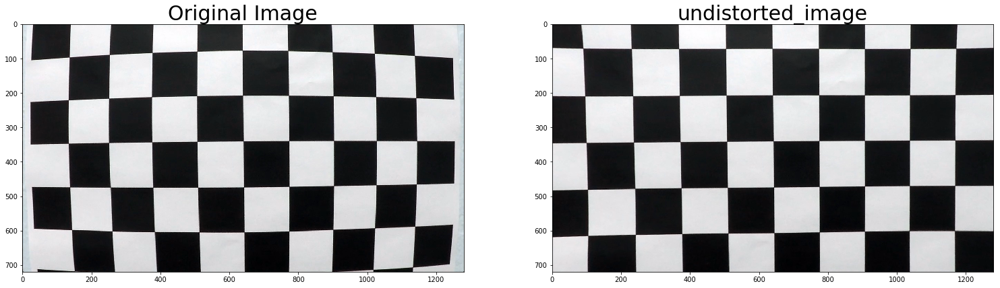

In [5]:
# Test undistortion on an image
save_mtx_dist()
img = cv2.imread('camera_cal/calibration1.jpg')
undistorted_image = undistort(img)

# save the undistorted image
cv2.imwrite('output_images/test_undistorted.jpg', undistorted_image)

plot_two(img1=img, img2=undistorted_image, title2='undistorted_image')

### Test: checked on one of the lane images as a test

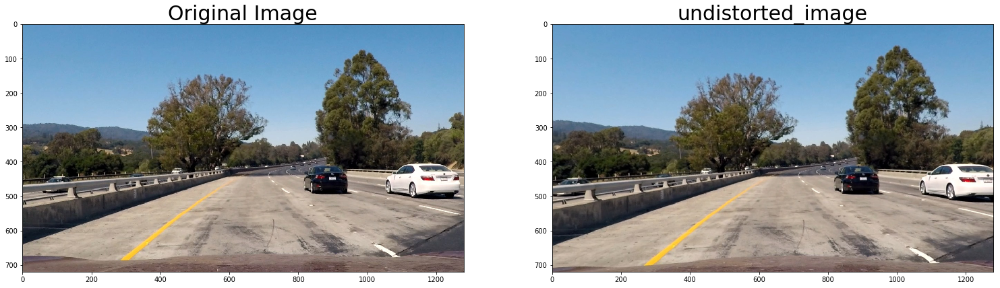

In [6]:
# Test undistortion on an image
img = mpimg.imread('test_images/test1.jpg')
undistorted_image = undistort(img)

# save the undistorted image
cv2.imwrite('output_images/test_undistorted_lane.jpg', cv2.cvtColor(undistorted_image, cv2.COLOR_BGR2RGB))

plot_two(img1=img, img2=undistorted_image, title2='undistorted_image')

## 3. Use color transforms, gradients, etc., to create a thresholded binary image.
### 3.1 Select edge by saturation gradients threshold
Identify possible lane pixels where the pixels' saturation gradients fall within a specified threshold range by sobel operator

In [5]:
def grad_xy_abs_thresh(img, orient='x', sobel_kernel=3, thresh=(0, 255)):
    """ create binary threshold image with clear lane lines
        by x,y direction's absolute threshold of saturation gradients
    :param img: undistorted image
    :param orient: gradient orientation x, y
    :param sobel_kernel: odd number to to smooth gradient measurements
    :param thresh: x,y direction's absolute gradient threshold(min, max)
    :return: binary threshold image
    """
    # Convert to HLS, take S channel
    img_hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
    img_saturation = img_hls[:, :, 2]

    # Apply x or y gradient with the OpenCV Sobel() function
    # and take the absolute value
    if orient == 'x':
        abs_sobel = np.absolute(cv2.Sobel(img_saturation, cv2.CV_64F, 1, 0, ksize=sobel_kernel))
    if orient == 'y':
        abs_sobel = np.absolute(cv2.Sobel(img_saturation, cv2.CV_64F, 0, 1, ksize=sobel_kernel))

    # Rescale back to 8 bit integer
    scaled_sobel = np.uint8(255 * abs_sobel / np.max(abs_sobel))

    # Create a copy and apply the threshold
    binary_output = np.zeros_like(scaled_sobel)
    binary_output[(scaled_sobel >= thresh[0]) & (scaled_sobel <= thresh[1])] = 1

    return binary_output


def grad_mag_thresh(img, sobel_kernel=3, mag_thresh=(0, 255)):
    """ create binary threshold image with clear lane lines
        by magnitude threshold of saturation gradients
    :param img: undistorted image
    :param sobel_kernel: odd number to to smooth gradient measurements
    :param mag_thresh: magnitude gradient threshold(min, max)
    :return: binary threshold image
    """
    # Convert to HLS, take S channel  of the gradient
    img_hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
    img_saturation = img_hls[:, :, 2]

    # Take both Sobel x and y gradients
    sobelx = cv2.Sobel(img_saturation, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(img_saturation, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    # Calculate the gradient magnitude
    grad_mag = np.sqrt(sobelx ** 2 + sobely ** 2)

    # Rescale to 8 bit
    scale_factor = np.max(grad_mag) / 255
    grad_mag = (grad_mag / scale_factor).astype(np.uint8)

    # Create a binary image of ones where threshold is met, zeros otherwise
    binary_output = np.zeros_like(grad_mag)
    binary_output[(grad_mag >= mag_thresh[0]) & (grad_mag <= mag_thresh[1])] = 1

    return binary_output


def grad_dir_threshold(img, sobel_kernel=3, dir_thresh=(0, np.pi / 2)):
    """ create binary threshold image with clear lane lines
        by direction threshold of saturation gradients
    :param img: undistorted image
    :param sobel_kernel: odd number to to smooth gradient measurements
    :param dir_thresh: direction gradient threshold(min, max)
    :return: binary threshold image
    """
    # Convert to HLS, take S channel
    img_hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
    img_saturation = img_hls[:, :, 2]

    # Calculate the x and y gradients
    sobelx = cv2.Sobel(img_saturation, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(img_saturation, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    # Take the absolute value of the gradient direction
    abs_grad_dir = np.arctan2(np.absolute(sobely), np.absolute(sobelx))

    # Create a copy and apply the threshold
    binary_output = np.zeros_like(abs_grad_dir)
    binary_output[(abs_grad_dir >= dir_thresh[0]) & (abs_grad_dir <= dir_thresh[1])] = 1

    return binary_output

### 3.2 Select the lane area by saturation threshold
the area of lane lines usually has a higher saturation

In [6]:
def saturation_threshold(img, thresh=(0, 255)):
    """ create binary threshold image with clear lane lines
        by saturation threshold in HLS color space
    :param img: undistorted image
    :param thresh: saturation threshold(min, max)
    :return: binary threshold image
    """
    hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
    s_channel = hls[:, :, 2]
    binary_output = np.zeros_like(s_channel)

    # select by S threshold
    binary_output[(s_channel > thresh[0]) & (s_channel <= thresh[1])] = 1

    return binary_output

### 3.3 Put together to create a thresholded binary image with clear lane lines

In [20]:
def threshold(undistort_img):
    """ create binary threshold image with clear lane lines
        by gradient threshold and color threshold
    :param undistort_img: undistorted image
    :return: binary threshold image
    """
    # Choose a larger odd number to smooth gradient measurements
    ksize = 5

    # Apply each of the threshold functions
    gradx = grad_xy_abs_thresh(undistort_img, orient='x', sobel_kernel=ksize, thresh=(20, 255))
    grady = grad_xy_abs_thresh(undistort_img, orient='y', sobel_kernel=ksize, thresh=(40, 255))
    grad_mag = grad_mag_thresh(undistort_img, sobel_kernel=ksize, mag_thresh=(40, 255))
    grad_dir = grad_dir_threshold(undistort_img, sobel_kernel=ksize, dir_thresh=(0.6, 1.1))

    # combine the selection thresholds
    # selection for pixels where both the xxx and yyy gradients meet the threshold criteria,
    # or the gradient magnitude and direction are both within their threshold values.
    combined_grad = np.zeros_like(grad_dir)
    combined_grad[((gradx == 1) & (grady == 1)) | ((grad_mag == 1) & (grad_dir == 1))] = 1

    s_binary = saturation_threshold(undistort_img, thresh=(150, 255))

    # Combine color and gradient thresholds
    combined_binary = np.zeros_like(s_binary)
    combined_binary[(combined_grad == 1) | (s_binary == 1)] = 1

    return combined_binary

### Test: gradient and color threshold

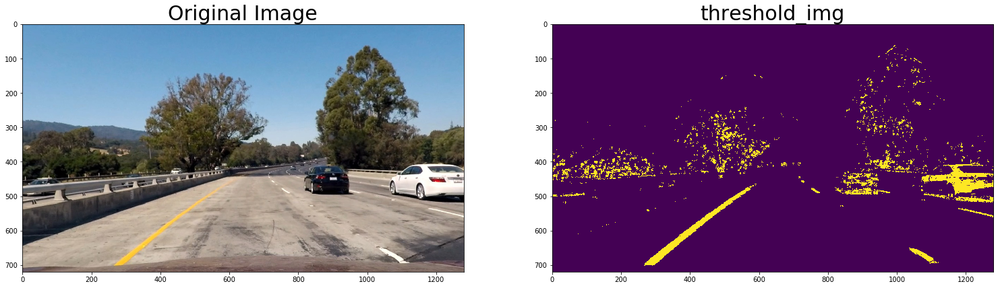

In [11]:
image = undistort(mpimg.imread('test_images/test1.jpg'))
threshold_img = threshold(image)

# save the threshold image
mpimg.imsave('output_images/test_threshold_lane.jpg', threshold_img)

plot_two(img1=image, img2=threshold_img, title2='threshold_img')

## 4. Apply a perspective transform to rectify binary image ("birds-eye view").

In [8]:
def perspective_transform(img, inv=False):
    """ perspective transform
    :param img: threshold binary image
    :param inv: whether to inverse perspective transform
    :return: warped image
    """
    img_size = (img.shape[1], img.shape[0])

    # source points/image lane corners
    src = np.float32([[180, img.shape[0]], [575, 460],
                      [705, 460], [1150, img.shape[0]]])
    # destination points
    dst = np.float32([[320, img.shape[0]], [320, 0],
                      [960, 0], [960, img.shape[0]]])

    # Given src and dst points, calculate the perspective transform matrix
    if not inv:
        M = cv2.getPerspectiveTransform(src, dst)
    else:  # inverse perspective transform matrix
        M = cv2.getPerspectiveTransform(dst, src)

    # Warp the image using OpenCV warpPerspective()
    warped = cv2.warpPerspective(img, M, img_size)

    return warped

### Test: perspective transform

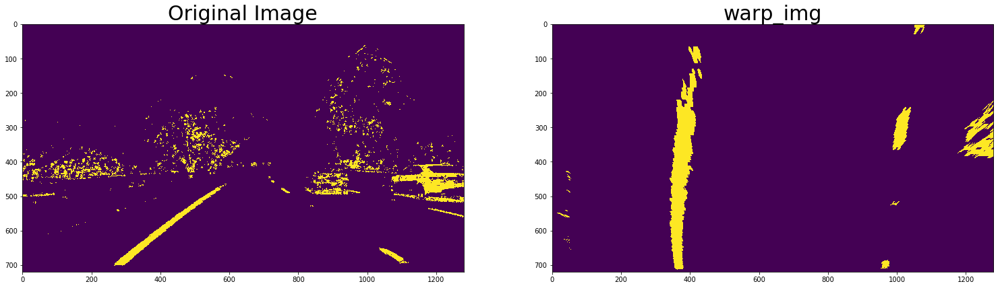

In [13]:
image = undistort(mpimg.imread('test_images/test1.jpg'))
threshold_img = threshold(image)
warp_img = perspective_transform(threshold_img, inv=False)

# save the warped image
mpimg.imsave('output_images/test_warp_lane.jpg', warp_img)

plot_two(img1=threshold_img, img2=warp_img, title2='warp_img')

## 5. Detect lane pixels and fit to find the lane boundary.

### 5.1 Locate the Lane Lines' start points by get Peaks in a Histogram

In [9]:
def region_of_interest(img):
    """ select interested region for interference elimination
        easier to get start points of lane lines from histogram
    :param img: warped binary threshold image
    :return: selected warped binary threshold image
    """
    imshape = img.shape

    x_offset = 150
    # create region select mask
    mask = np.zeros_like(img)
    vertices = np.array([[(x_offset, imshape[0]), (x_offset, 0),
                          (imshape[1] - x_offset, 0),
                          (imshape[1] - x_offset, imshape[0])]], dtype=np.int32)
    # Fill pixels inside the vertices' polygon with the fill color
    cv2.fillPoly(mask, vertices, 255)

    # Return the image only where mask pixels are nonzero
    masked_image = cv2.bitwise_and(img, mask)

    return masked_image


def get_start_x(img):
    """ get the start points of lane lines by histogram
    :param img: warped binary threshold image
    :return:
        leftx_base, rightx_base: lane lines start points' x
        histogram(optional): binary image's bottom column sum
    """
    # Grab only the bottom half of the image
    # Lane lines are likely to be mostly vertical nearest to the car
    bottom_half = img[img.shape[0] // 2:, :]

    # Sum across image pixels vertically - make sure to set an `axis`
    # i.e. the highest areas of vertical lines should be larger values
    histogram = np.sum(bottom_half, axis=0)

    # Find the peak of the left and right halves of the histogram
    # These will be the starting point for the left and right lines
    midpoint = np.int(histogram.shape[0] // 2)
    leftx_base = np.argmax(histogram[:midpoint])
    rightx_base = np.argmax(histogram[midpoint:]) + midpoint

    return leftx_base, rightx_base, histogram

### Test

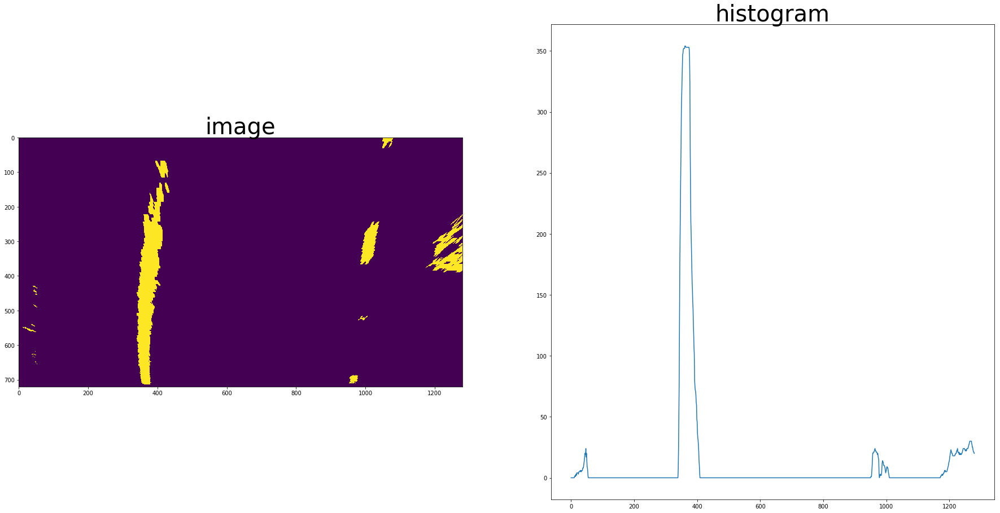

In [16]:
image = undistort(mpimg.imread('test_images/test1.jpg'))
threshold_img = threshold(image)
warp_img = perspective_transform(threshold_img, inv=False)
leftx_base, rightx_base, histogram = get_start_x(warp_img)

f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24,13))
ax1.imshow(warp_img)
ax1.set_title('image', fontsize=40)
ax2.plot(histogram)
ax2.set_title('histogram', fontsize=40)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
plt.show()

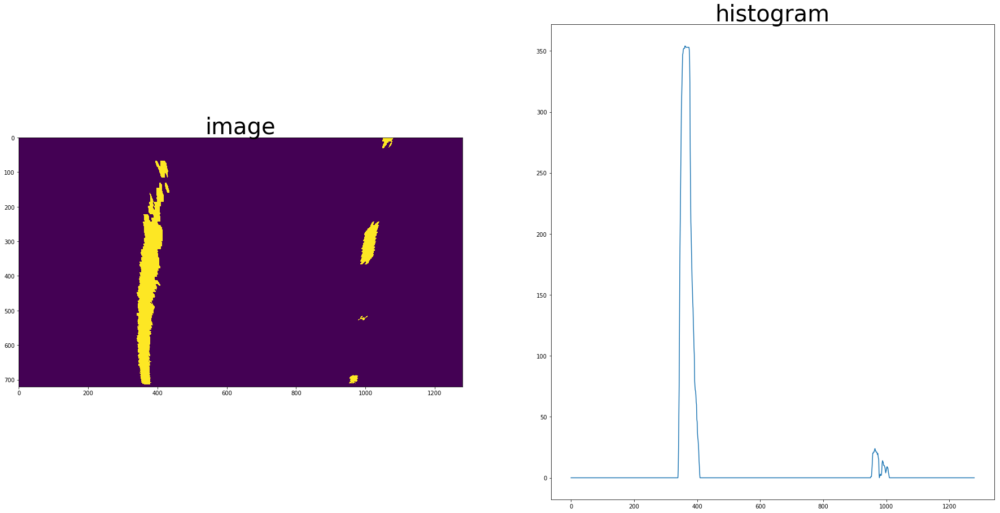

In [17]:
# select region
image = undistort(mpimg.imread('test_images/test1.jpg'))
threshold_img = threshold(image)
warp_img = region_of_interest(perspective_transform(threshold_img, inv=False))
leftx_base, rightx_base, histogram = get_start_x(warp_img)

f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24,13))
ax1.imshow(warp_img)
ax1.set_title('image', fontsize=40)
ax2.plot(histogram)
ax2.set_title('histogram', fontsize=40)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
plt.show()

### 5.2 Sliding Windows and Fit lane line's Polynomial

In [11]:
def find_lane_pixels_first(binary_warped, nwindows=9, margin=100, minpix=50):
    """ find image's lane pixels by slide windows
    :param binary_warped: warped binary image
    :param nwindows: the number of sliding windows
    :param margin: the width of the windows +/- margin
    :param minpix: minimum number of pixels found to recenter window
    :return:
        leftx, lefty: finded left lane pixels
        rightx, righty: finded right lane pixels
        out_img(optional): warped binary image
            with colored finded lines pixels
    """
    # get start points of lane lines
    leftx_base, rightx_base, histogram = get_start_x(binary_warped)

    # Set height of windows - based on nwindows above and image shape
    window_height = np.int(binary_warped.shape[0] // nwindows)

    # Create an output image to draw on and visualize the result
    out_img = np.dstack((binary_warped, binary_warped, binary_warped))

    # Identify the x and y positions of all nonzero pixels in the image
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])

    # Create empty lists to receive left and right lane pixel indices
    left_lane_inds = []
    right_lane_inds = []

    # start from start points
    leftx_current, rightx_current = leftx_base, rightx_base
    # slide window, Step through the windows one by one
    for window in range(nwindows):
        # Identify window boundaries in x and y (and right and left)
        win_y_low = binary_warped.shape[0] - (window + 1) * window_height
        win_y_high = binary_warped.shape[0] - window * window_height
        win_xleft_low = leftx_current - margin
        win_xleft_high = leftx_current + margin
        win_xright_low = rightx_current - margin
        win_xright_high = rightx_current + margin

        # Identify the nonzero pixels in x and y within the window #
        good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) &
                          (nonzerox >= win_xleft_low) & (nonzerox < win_xleft_high)).nonzero()[0]
        good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) &
                           (nonzerox >= win_xright_low) & (nonzerox < win_xright_high)).nonzero()[0]

        # Append these indices to the lists
        left_lane_inds.append(good_left_inds)
        right_lane_inds.append(good_right_inds)

        # If you found > minpix pixels, recenter next window on their mean position
        if len(good_left_inds) > minpix:
            leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
        if len(good_right_inds) > minpix:
            rightx_current = np.int(np.mean(nonzerox[good_right_inds]))

    # Concatenate the arrays of indices (previously was a list of lists of pixels)
    try:
        left_lane_inds = np.concatenate(left_lane_inds)
        right_lane_inds = np.concatenate(right_lane_inds)
    except ValueError:
        # Avoids an error if the above is not implemented fully
        pass

    # Extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds]
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]

    # Colors in the finded left and right lane regions
    out_img[lefty, leftx] = [255, 0, 0]
    out_img[righty, rightx] = [0, 0, 255]

    return leftx, lefty, rightx, righty, out_img

In [12]:
def fit_polynomial(leftx, lefty, rightx, righty):
    """ fit ploynomial coefficients A,B,C
        by finded pixels
        x=f(y)=A*y^2 + B*y + C
    :param leftx, lefty, rightx, righty: x,y values of finded lanes' pixels
    :return: left_fit, right_fit: fitted lines ploynomial coefficients (A,B,C)
    """
    # Fit a second order polynomial coefficients (A, B, C)
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)

    return left_fit, right_fit


def generate_fitted_line(left_fit, right_fit, img_shape=(720, 1280)):
    """ generate fitted lines
        by fitted lines' ploynomial coefficients (A,B,C)
    :param left_fit: fitted left line ploynomial coefficients (A,B,C)
    :param right_fit:
    :param img_shape: image shape(height, width)
    :return:
        left_fitx: x values of fitted left line points
        right_fitx:
        ploty: y values of fitted line points
    """
    # Generate y values of fitted lines
    ploty = np.linspace(0, img_shape[0] - 1, img_shape[0])
    # Calc x values, using ploty and polynomials coefficients left_fit and right_fit
    left_fitx = left_fit[0] * ploty ** 2 + left_fit[1] * ploty + left_fit[2]
    right_fitx = right_fit[0] * ploty ** 2 + right_fit[1] * ploty + right_fit[2]

    return left_fitx, right_fitx, ploty

### Test

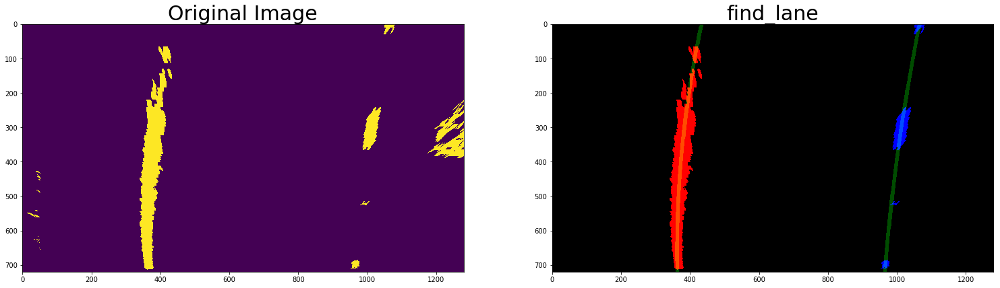

In [20]:
image = undistort(mpimg.imread('test_images/test1.jpg'))
threshold_img = threshold(image)
warp_img = perspective_transform(threshold_img, inv=False)
select_img = region_of_interest(warp_img)
leftx, lefty, rightx, righty, out_img = find_lane_pixels_first(select_img)
left_fit, right_fit = fit_polynomial(leftx, lefty, rightx, righty)
left_fitx, right_fitx, ploty = generate_fitted_line(left_fit, right_fit)

# draw fitted lines
lines_img = np.zeros_like(out_img)
margin = 5
left_line_margin1 = np.array([np.transpose(np.vstack([left_fitx-margin, ploty]))])
left_line_margin2 = np.array([np.flipud(np.transpose(np.vstack([left_fitx+margin, 
                          ploty])))])
left_line_pts = np.hstack((left_line_margin1, left_line_margin2))
right_line_margin1 = np.array([np.transpose(np.vstack([right_fitx-margin, ploty]))])
right_line_margin2 = np.array([np.flipud(np.transpose(np.vstack([right_fitx+margin, 
                          ploty])))])
right_line_pts = np.hstack((right_line_margin1, right_line_margin2))

cv2.fillPoly(lines_img, np.int_([left_line_pts]), (0,255, 0))
cv2.fillPoly(lines_img, np.int_([right_line_pts]), (0,255, 0))
fitted_img = cv2.addWeighted(out_img, 1, lines_img, 0.3, 0)

# save the image with fitted lane lines
cv2.imwrite('output_images/test_fitted_lane.jpg', fitted_img)

plot_two(img1=warp_img, img2=fitted_img, title2='find_lane')

### 5.3 Use the previous polynomial to skip the sliding window

In [13]:
def find_lane_pixels_around(binary_warped, left_fit, right_fit, margin=100):
    """ find lane pixels around video last frame's fitted area
    :param binary_warped: warped binary undistort image
    :param left_fit: (A,B,C) last frame's polynomial coefficient of fitted left line
    :param right_fit:
    :param margin: width of search windows around the previous polynomial
    :return: leftx, lefty, rightx, righty: finded lane pixels
    """
    # Create an output image to draw on and visualize the result
    out_img = np.dstack((binary_warped, binary_warped, binary_warped))

    # Grab activated pixels
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])

    a_left, b_left, c_left = left_fit[0], left_fit[1], left_fit[2]
    a_right, b_right, c_right = right_fit[0], right_fit[1], right_fit[2]
    # Set the search area based on activated x-values
    # within the +/- margin of our polynomial function
    left_fit_x_ = a_left * (nonzeroy ** 2) + b_left * nonzeroy + c_left
    right_fit_x = a_right * (nonzeroy ** 2) + b_right * nonzeroy + c_right

    win_xleft_low = left_fit_x_ - margin
    win_xleft_high = left_fit_x_ + margin
    win_xright_low = right_fit_x - margin
    win_xright_high = right_fit_x + margin

    # search around last frame
    left_lane_inds = ((nonzerox > win_xleft_low) & (nonzerox < win_xleft_high))
    right_lane_inds = ((nonzerox > win_xright_low) & (nonzerox < win_xright_high))

    # Again, extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds]
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]

    # Colors in the finded left and right lane regions
    out_img[lefty, leftx] = [255, 0, 0]
    out_img[righty, rightx] = [0, 0, 255]

    return leftx, lefty, rightx, righty, out_img

### Test

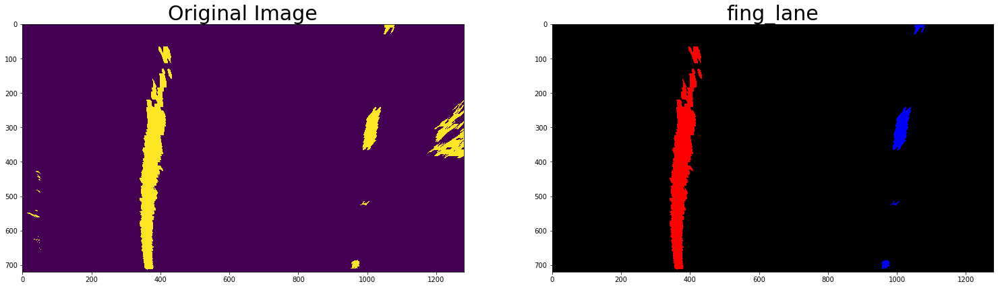

In [22]:
# last frame's fitted polynomial coefficient
image = undistort(mpimg.imread('test_images/test1.jpg'))
threshold_img = threshold(image)
warp_img = perspective_transform(threshold_img, inv=False)
select_img = region_of_interest(warp_img)
leftx, lefty, rightx, righty, out_img = find_lane_pixels_first(select_img)
left_fit, right_fit = fit_polynomial(leftx, lefty, rightx, righty)

image = undistort(mpimg.imread('test_images/test1.jpg'))
threshold_img = threshold(image)
warp_img = perspective_transform(threshold_img, inv=False)
select_img = region_of_interest(warp_img)
leftx, lefty, rightx, righty, out_img = find_lane_pixels_around(warp_img, left_fit, right_fit)

plot_two(img1=warp_img, img2=out_img, title2='fing_lane')

## 6. Determine the curvature of the lane and vehicle position with respect to center.

In [14]:
def get_real_curvature_offset(left_fit, right_fit, y_eval=719):
    """ calculates the curvature of polynomial functions in meter
        and x offset of vehicle position/lane center and image center in meter
    :param left_fit: (A,B,C) polynomial coefficient of fitted left lane line
    :param right_fit:
    :param y_eval: vehicle position y/max y value of image-1/image height-1
    :return:
        left_curverad, right_curverad: real curvature of lane lines
        position_offset: offset of vehicle position and image center
    """
    # Define conversions in x and y from pixels space to meters
    ym_per_pix = 30 / 720  # meters per pixel in y dimension
    xm_per_pix = 3.7 / 700  # meters per pixel in x dimension
    
    # convert polynomials coefficient from the pixels' to meters'
    a_left_fit_cr = xm_per_pix / (ym_per_pix ** 2) * left_fit[0]
    b_left_fit_cr = xm_per_pix / ym_per_pix * left_fit[1]
    c_left_fit_cr = xm_per_pix * left_fit[2]
    a_right_fit_cr = xm_per_pix / (ym_per_pix ** 2) * right_fit[0]
    b_right_fit_cr = xm_per_pix / ym_per_pix * right_fit[1]
    c_right_fit_cr = xm_per_pix * right_fit[2]
    
    # Define y-value where we want radius of curvature
    # We'll choose the maximum y-value, corresponding to the bottom of the image
    y_eval_cr = y_eval * ym_per_pix

    # Calculation of R_curve (radius of curvature)
    left_curverad = ((1 + (2 * a_left_fit_cr * y_eval_cr + b_left_fit_cr) ** 2) ** 1.5) / np.absolute(
        2 * a_left_fit_cr)
    right_curverad = ((1 + (2 * a_right_fit_cr * y_eval_cr + b_right_fit_cr) ** 2) ** 1.5) / np.absolute(
        2 * a_right_fit_cr)

    # calculate x value in lane bottom in meter
    left_lane_bottom_x = a_left_fit_cr * y_eval_cr ** 2 + b_left_fit_cr * y_eval_cr + c_left_fit_cr
    right_lane_bottom_x = a_right_fit_cr * y_eval_cr ** 2 + b_right_fit_cr * y_eval_cr + c_right_fit_cr
    
    # calculate x value of vehicle position/lane center's in meter
    vehicle_postion_x = (left_lane_bottom_x + right_lane_bottom_x) / 2
    # calculate x value of image center in meter
    image_mid_x = 1280 / 2 * xm_per_pix
    # calculate vehicle position offset with respect to center
    position_offset = image_mid_x - vehicle_postion_x

    return left_curverad, right_curverad, position_offset

### Test

In [24]:
image = undistort(mpimg.imread('test_images/test1.jpg'))
threshold_img = threshold(image)
warp_img = perspective_transform(threshold_img, inv=False)
select_img = region_of_interest(warp_img)
leftx, lefty, rightx, righty, out_img = find_lane_pixels_first(select_img)
left_fit, right_fit = fit_polynomial(leftx, lefty, rightx, righty)

left_curverad, right_curverad, position_offset = get_real_curvature_offset(left_fit, right_fit)
print('left curverad: ', left_curverad, 'm')
print('right curverad: ', right_curverad, 'm')
print('position offset: ', position_offset, 'm')

left curverad:  1005.586225991279 m
right curverad:  1895.685310360918 m
position offset:  -0.1230967165893424 m


## 7. Warp the detected lane boundaries back onto the original image.

In [15]:
def warp_back(undist, warped, left_fit, right_fit):
    """ inverse warp the warped image with clear lane area back to original format
        and stack clear lane area with the original undistorted image
    :param undist: original undistorted image
    :param warped: warped image with clear lane area
    :param left_fit: polynomial coefficient of fitted left line
    :param right_fit:
    :return: warp_back: stack clear lane area with the original undistorted image
    """
    # generate fitted line in
    left_fitx, right_fitx, ploty = generate_fitted_line(left_fit, right_fit)

    # Create an image to draw the lines on
    warp_zero = np.zeros_like(warped).astype(np.uint8)
    color_warp = np.dstack((warp_zero, warp_zero, warp_zero))

    # Recast the x and y points into usable format for cv2.fillPoly()
    pts_left = np.array([np.transpose(np.vstack([left_fitx, ploty]))])
    pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, ploty])))])
    pts = np.hstack((pts_left, pts_right))

    # Draw the lane onto the warped blank image
    cv2.fillPoly(color_warp, np.int_([pts]), (0, 255, 0))

    # inverse warp the warped image back to original image space
    new_warp = perspective_transform(color_warp, inv=True)
    # Combine the result with the original image
    warp_back = cv2.addWeighted(undist, 1, new_warp, 0.3, 0)

    return warp_back

### Test

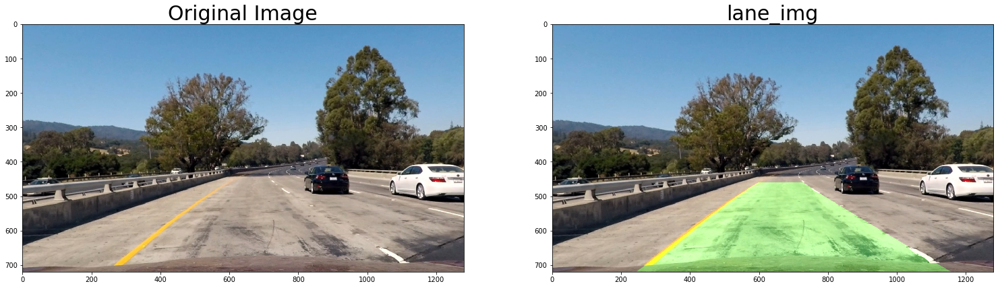

In [26]:
image = undistort(mpimg.imread('test_images/test1.jpg'))
threshold_img = threshold(image)
warp_img = region_of_interest(perspective_transform(threshold_img, inv=False))
leftx, lefty, rightx, righty, out_img = find_lane_pixels_first(warp_img)
left_fit, right_fit = fit_polynomial(leftx, lefty, rightx, righty)

warp_back_img = warp_back(image, warp_img, left_fit, right_fit)

plot_two(img1=image, img2=warp_back_img, title2='lane_img')

## 8. Output visual display of the lane boundaries and numerical estimation of lane curvature and vehicle position.

In [16]:
def visual_result(warp_back, left_fit, right_fit, binary_image=None):
    """ visual display of numerical estimation of lane curvature and vehicle position
        and a thumb binary image of finded lane pixels for observe
    :param warp_back: inverse warped image with clear lane area
    :param left_fit, right_fit: polynomial coefficient of fitted lines
    :param binary_image: binary_image with fitted lane pixels
    :return: result image
    """
    # thumb image parameter
    thumb_image_width = 300
    thumb_image_height = 180
    x_offset = warp_back.shape[1] - thumb_image_width - 30
    y_offset = 30
    # resize binary image
    thumb_image = cv2.resize(binary_image, (thumb_image_width, thumb_image_height), interpolation=cv2.INTER_CUBIC)
    # draw thumb image to warped back image
    warp_back[y_offset: y_offset + thumb_image_height, x_offset:x_offset + thumb_image_width] = thumb_image

    # visual display of numerical estimation
    left_curverad, right_curverad, position_offset = get_real_curvature_offset(left_fit, right_fit)
    # label format
    font = cv2.FONT_HERSHEY_SIMPLEX
    curv_l_label = 'Radius of Curvature (Left line): {:.0f} m.'.format(left_curverad)
    curv_r_label = 'Radius of Curvature (Right line): {:.0f} m.'.format(right_curverad)
    deviation_label = 'Vehicle Deviation: {:.3f} m.'.format(position_offset)
    # draw numerical estimation to warped back image
    cv2.putText(warp_back, curv_l_label, (30, 60), font, 1, (255, 255, 255), 2)
    cv2.putText(warp_back, curv_r_label, (30, 110), font, 1, (255, 255, 255), 2)
    cv2.putText(warp_back, deviation_label, (30, 160), font, 1, (255, 255, 255), 2)

    return warp_back

### Test

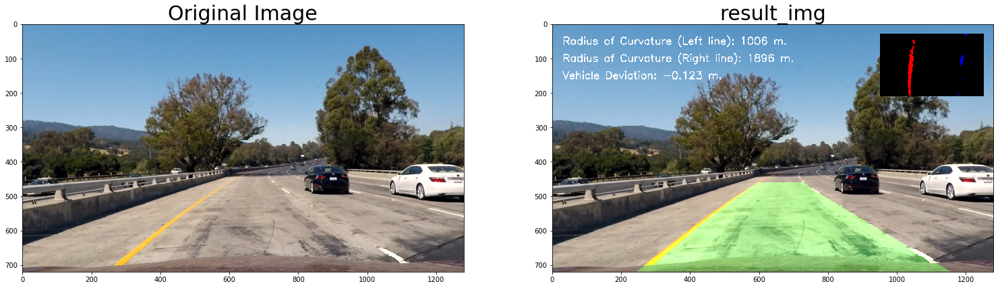

In [28]:
image = undistort(mpimg.imread('test_images/test1.jpg'))
threshold_img = threshold(image)
warp_img = region_of_interest(perspective_transform(threshold_img, inv=False))
leftx, lefty, rightx, righty, out_img = find_lane_pixels_first(warp_img)
left_fit, right_fit = fit_polynomial(leftx, lefty, rightx, righty)
warp_back_img = warp_back(image, warp_img, left_fit, right_fit)
                          
result_img = visual_result(warp_back_img, left_fit, right_fit, out_img)

# save the image with fitted lane lines
cv2.imwrite('output_images/test_result_lane.jpg', cv2.cvtColor(result_img, cv2.COLOR_BGR2RGB))

plot_two(img1=image, img2=result_img, title2='result_img')

## Image Pipeline

In [17]:
def image_pipeline(image):
    """ put all together
    :param image: imread image
    :return: result image
    """
    # pre-process
    undist_image = undistort(image)
    binary_image = threshold(undist_image)
    warped_image = region_of_interest(perspective_transform(binary_image))
    
    leftx, lefty, rightx, righty, out_img = find_lane_pixels_first(warped_image)
    left_fit, right_fit = fit_polynomial(leftx, lefty, rightx, righty)
    
    warp_back_image = warp_back(undist_image, warped_image, left_fit, right_fit)
    result_image = visual_result(warp_back_image, left_fit, right_fit, out_img)

    return result_image

### Test images

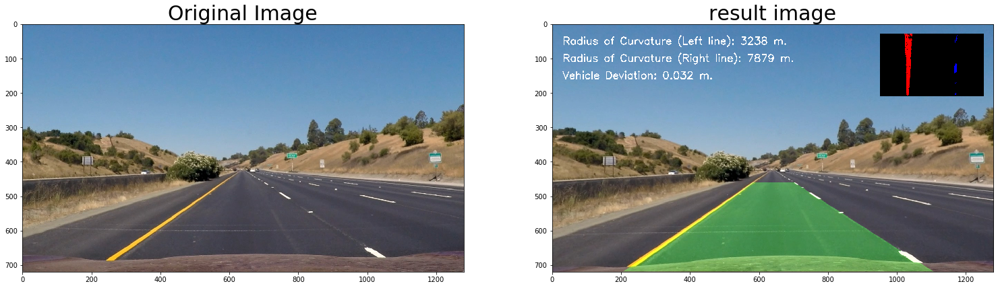

In [45]:
image = mpimg.imread('test_images/straight_lines1.jpg')
result_image = image_pipeline(image)

cv2.imwrite('output_images/result_straight_lines1.jpg', cv2.cvtColor(result_image, cv2.COLOR_BGR2RGB))
plot_two(image, result_image, 'result image')

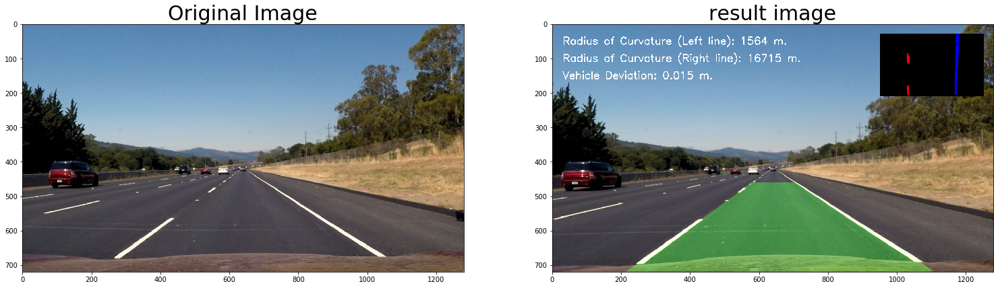

In [46]:
image = mpimg.imread('test_images/straight_lines2.jpg')
result_image = image_pipeline(image)

cv2.imwrite('output_images/result_straight_lines2.jpg', cv2.cvtColor(result_image, cv2.COLOR_BGR2RGB))
plot_two(image, result_image, 'result image')

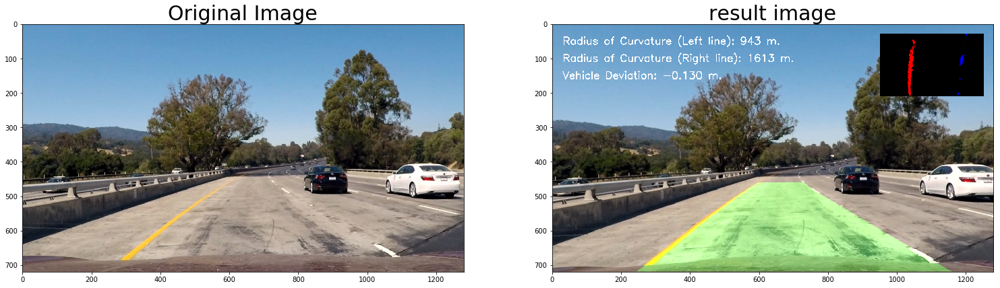

In [47]:
image = mpimg.imread('test_images/test1.jpg')
result_image = image_pipeline(image)

cv2.imwrite('output_images/result_test1.jpg', cv2.cvtColor(result_image, cv2.COLOR_BGR2RGB))
plot_two(image, result_image, 'result image')

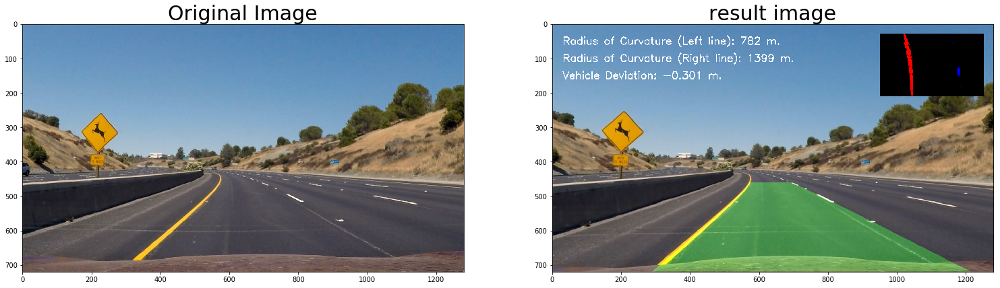

In [48]:
image = mpimg.imread('test_images/test2.jpg')
result_image = image_pipeline(image)

cv2.imwrite('output_images/result_test2.jpg', cv2.cvtColor(result_image, cv2.COLOR_BGR2RGB))
plot_two(image, result_image, 'result image')

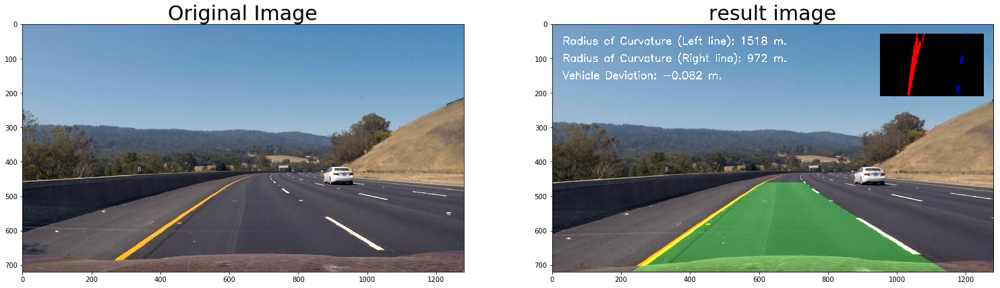

In [49]:
image = mpimg.imread('test_images/test3.jpg')
result_image = image_pipeline(image)

cv2.imwrite('output_images/result_test3.jpg', cv2.cvtColor(result_image, cv2.COLOR_BGR2RGB))
plot_two(image, result_image, 'result image')

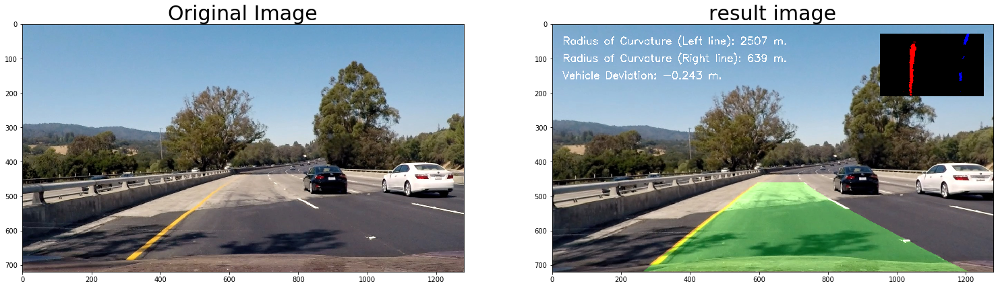

In [50]:
image = mpimg.imread('test_images/test4.jpg')
result_image = image_pipeline(image)

cv2.imwrite('output_images/result_test4.jpg', cv2.cvtColor(result_image, cv2.COLOR_BGR2RGB))
plot_two(image, result_image, 'result image')

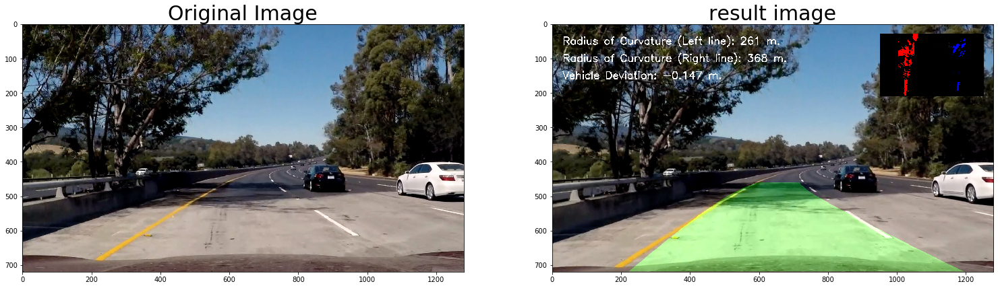

In [51]:
image = mpimg.imread('test_images/test5.jpg')
result_image = image_pipeline(image)

cv2.imwrite('output_images/result_test5.jpg', cv2.cvtColor(result_image, cv2.COLOR_BGR2RGB))
plot_two(image, result_image, 'result image')

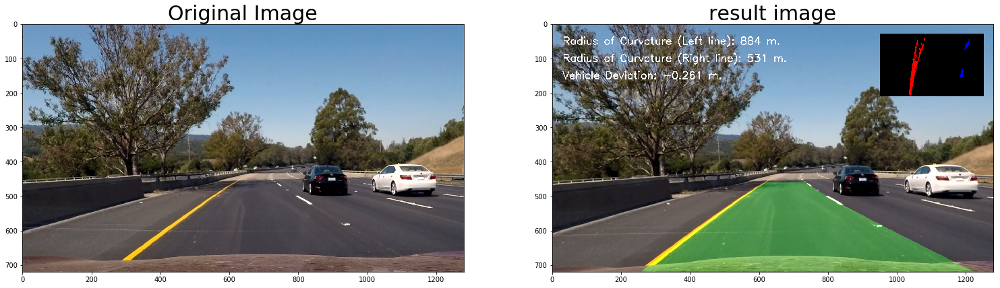

In [52]:
image = mpimg.imread('test_images/test6.jpg')
result_image = image_pipeline(image)

cv2.imwrite('output_images/result_test6.jpg', cv2.cvtColor(result_image, cv2.COLOR_BGR2RGB))
plot_two(image, result_image, 'result image')

## Video Pipeline

In [28]:
# Define a class to receive the characteristics of each line detection
class Line:
    def __init__(self):
        # was the line detected in the last iteration?
        self.detected = False
        # x values for detected line pixels
        self.allx = None
        # y values for detected line pixels
        self.ally = None

        # polynomial coefficients for the most recent fit
        self.current_fit = [np.array([False])]

        # save polynomial coefficients of the last n iterations
        self.all_fit = []
        # averaged polynomial coefficients of the last n iterations
        self.best_fit = None

        
def video_pipeline(image):
    """ put all together
    :param image: imread image
    :return: result image
    """
    # pre-process
    undist_image = undistort(image)
    binary_image = threshold(undist_image)
    warped_image = region_of_interest(perspective_transform(binary_image))

    ## find enough line pixels(around last-->slide window-->use last)
    # find around last if had detected two lines from last frame
    if left_line.detected and right_line.detected:
        leftx, lefty, rightx, righty, out_img = \
            find_lane_pixels_around(warped_image, left_line.current_fit, right_line.current_fit)
        # back to slide window if not detect enough lines pixels
        if (len(leftx) < 100) or (len(rightx) < 100):
            leftx, lefty, rightx, righty, out_img = find_lane_pixels_first(warped_image)
    else:   # slide window if first detect or not detected two lines from last frame
        leftx, lefty, rightx, righty, out_img = find_lane_pixels_first(warped_image)
    # mark if detect enough lines pixels
    if len(leftx) > 100:
        left_line.detected = True
        left_line.allx = leftx
        left_line.ally = lefty
    else:   # use last frame's find pixels if not detect enough lines pixels
        left_line.detected = False
        leftx = left_line.allx
        lefty = left_line.ally
    if len(rightx) > 100:
        right_line.detected = True
        right_line.allx = rightx
        right_line.ally = righty
    else:
        right_line.detected = False
        rightx = left_line.allx
        righty = left_line.ally

    ## fit sanity polynomial(check this and last-->best/average fit)
    left_fit, right_fit = fit_polynomial(leftx, lefty, rightx, righty)
    # init
    if not left_line.current_fit[0]:
        left_line.current_fit = left_fit
        right_line.current_fit = right_fit
    # sanity check: similar curvature between this fit and last fit
    if abs(left_line.current_fit[1] - left_fit[1]) > 0.18:  # use average/best fit if new lines aren't sanity
        left_fit = left_line.best_fit
        left_line.detected = False
    else:   # mark if new fit is sanity
        left_line.current_fit = left_fit
        left_line.detected = True
        # compute new average fit
        left_line.all_fit.append(left_line.current_fit)
        sum_fit = np.array([0, 0, 0], dtype='float')
        for element in left_line.all_fit:
            sum_fit = sum_fit + element
        left_line.best_fit = sum_fit / (len(left_line.all_fit))
    if abs(right_line.current_fit[1] - right_fit[1]) > 0.18:  # use average/best fit if new lines aren't sanity
        right_fit = right_line.best_fit
        right_line.detected = False
    else:   # mark if new fit is sanity
        right_line.current_fit = right_fit
        right_line.detected = True
        # compute new average fit
        right_line.all_fit.append(right_line.current_fit)
        sum_fit = np.array([0, 0, 0], dtype='float')
        for element in right_line.all_fit:
            sum_fit = sum_fit + element
        right_line.best_fit = sum_fit / (len(right_line.all_fit))

    warp_back_image = warp_back(undist_image, warped_image, left_fit, right_fit)
    result_image = visual_result(warp_back_image, left_fit, right_fit, out_img)

    return result_image

### Test videos

In [29]:
left_line = Line()
right_line = Line()
output_video = 'output_videos/result_project_video.mp4'
clip1 = VideoFileClip("test_videos/project_video.mp4")
video_clip = clip1.fl_image(video_pipeline)
%time video_clip.write_videofile(output_video, audio=False)

[MoviePy] >>>> Building video output_videos/result_project_video.mp4
[MoviePy] Writing video output_videos/result_project_video.mp4



  5%|████▎                                                                           | 67/1261 [00:12<03:41,  5.40it/s]


 11%|████████▍                                                                      | 135/1261 [00:24<03:24,  5.51it/s]


 16%|████████████▋                                                                  | 203/1261 [00:37<03:11,  5.53it/s]


 21%|████████████████▉                                                              | 271/1261 [00:49<03:03,  5.39it/s]


 27%|█████████████████████▏                                                         | 339/1261 [01:02<02:52,  5.34it/s]


 32%|█████████████████████████▍                                                     | 407/1261 [01:14<02:38,  5.38it/s]


 38%|█████████████████████████████▊                                                 | 475/1261 [01:27<02:27,  5.34it/s]


 43%|██████████████████████████████████                                             | 543/1261 [01:40<02:11,  5.47it/s]


 48%|██████████████████████████████████████▎                                        | 611/1261 [01:52<01:59,  5.45it/s]


 54%|██████████████████████████████████████████▌                                    | 679/1261 [02:05<01:49,  5.33it/s]


 59%|██████████████████████████████████████████████▊                                | 747/1261 [02:18<01:33,  5.47it/s]


 65%|███████████████████████████████████████████████████                            | 815/1261 [02:30<01:23,  5.36it/s]


 70%|███████████████████████████████████████████████████████▎                       | 883/1261 [02:43<01:10,  5.39it/s]


 75%|███████████████████████████████████████████████████████████▌                   | 951/1261 [02:56<00:57,  5.43it/s]


 81%|███████████████████████████████████████████████████████████████               | 1019/1261 [03:08<00:45,  5.30it/s]


 86%|███████████████████████████████████████████████████████████████████▏          | 1087/1261 [03:21<00:32,  5.31it/s]


 92%|███████████████████████████████████████████████████████████████████████▍      | 1155/1261 [03:34<00:19,  5.31it/s]


 97%|███████████████████████████████████████████████████████████████████████████▋  | 1223/1261 [03:47<00:07,  5.29it/s]


100%|█████████████████████████████████████████████████████████████████████████████▉| 1260/1261 [03:54<00:00,  5.40it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: output_videos/result_project_video.mp4 

Wall time: 3min 54s


In [30]:
HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(output_video))